# Temperature Forecast Project (Evaluation Project - 9)

### Problem Statement:

#### Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.


#### Attribute Information:

For more information, read [Cho et al, 2020].

1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

#### Please note that there are two target variables here: 

#### 1) Next_Tmax: Next day maximum temperature

#### 2) Next_Tmin: Next day  minimum temperature

#### To download the dataset, use the link given below :

https://github.com/SANJAY9068068086/Machine-Learning-DataSets/blob/e862af779b0f342e6090e60ec0424b4eec6f8443/temperature.csv

In [1]:
# Let's import some necessary libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Let's import the datasest

temp_data = pd.read_csv("temperature.csv")
temp_data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
# Let's check the shape of the dataset

temp_data.shape

(7752, 25)

There are  7752 Rows and 25 Columns in the dataset in which 2 columns are our target.

In [4]:
# Quick dataset about dataset

temp_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


There is only one object column which is date. So, let's convert in into numerical form...

In [5]:
# Let's convert the Date column object to float or int

temp_data["Date"] = pd.to_numeric(temp_data["Date"].str.replace("-",""))

temp_data["Date"].dtype

dtype('float64')

In [6]:
# Let's check the null values...

feature = temp_data.isnull().sum().keys().tolist()
miss_data = temp_data.isnull().sum().values.tolist()
missing_report = pd.DataFrame(list(zip(feature, miss_data)), columns = ["Columns", "Missed Data"])
missing_report["Missing %"] = round(((missing_report["Missed Data"]/temp_data.shape[0])*100),2)
missing_report

,Columns,Missed Data,Missing %
0,station,2,0.03
1,Date,2,0.03
2,Present_Tmax,70,0.90
3,Present_Tmin,70,0.90
4,LDAPS_RHmin,75,0.97
5,LDAPS_RHmax,75,0.97
6,LDAPS_Tmax_lapse,75,0.97
7,LDAPS_Tmin_lapse,75,0.97
8,LDAPS_WS,75,0.97
9,LDAPS_LH,75,0.97


It seems that data is not so much missed. Let's check if there any "0" values are present in the dataset.

In [7]:
# Let's check the  value count of each column

for col in temp_data:
    print(col+ " = "+str(temp_data[temp_data[col]==0].shape[0]))

station = 0
Date = 0
Present_Tmax = 0
Present_Tmin = 0
LDAPS_RHmin = 0
LDAPS_RHmax = 0
LDAPS_Tmax_lapse = 0
LDAPS_Tmin_lapse = 0
LDAPS_WS = 0
LDAPS_LH = 0
LDAPS_CC1 = 108
LDAPS_CC2 = 95
LDAPS_CC3 = 76
LDAPS_CC4 = 137
LDAPS_PPT1 = 4844
LDAPS_PPT2 = 5151
LDAPS_PPT3 = 5294
LDAPS_PPT4 = 5751
lat = 0
lon = 0
DEM = 0
Slope = 0
Solar radiation = 0
Next_Tmax = 0
Next_Tmin = 0


Total Rows in the dataset are 7752 and out of these there are 4 columns have 0 counts more than 60 %

LDAPS_PPT1 = 4844*100/7752 = 62.487 % data is missed

LDAPS_PPT2 = 5151*100/7752 = 66.447 % data is missed

LDAPS_PPT3 = 5294*100/7752 = 68.292 % data is missed

LDAPS_PPT4 = 5751*100/7752 = 74.187 % data is missed

As I can see that huge data is missed and it's not good for predicted model. So, let's drop these 4 columns.

In [8]:
# Let's drop the above said 4 columns

temp_data.drop(columns = ["LDAPS_PPT1", "LDAPS_PPT2", "LDAPS_PPT3", "LDAPS_PPT4"], axis=1, inplace=True)

In [9]:
# Now let's check the pending null value indexes

index = temp_data.index[temp_data.isnull().any(axis=1)]
index

Int64Index([ 225,  271,  300,  450,  464,  627,  831,  856,  881,  913,
            ...
            7571, 7579, 7596, 7604, 7605, 7629, 7682, 7707, 7750, 7751],
           dtype='int64', length=164)

There are only 164 index where dataset has null values. So, let's drop these indexs..

In [10]:
# Droping the NaN Indexes

temp_data.drop(index, axis=0, inplace=True)

In [11]:
# Let's again check the null values if any...

feature = temp_data.isnull().sum().keys().tolist()
miss_data = temp_data.isnull().sum().values.tolist()
missing_report = pd.DataFrame(list(zip(feature, miss_data)), columns = ["Columns", "Missed Data"])
missing_report["Missing %"] = round(((missing_report["Missed Data"]/temp_data.shape[0])*100),2)
missing_report

,Columns,Missed Data,Missing %
0,station,0,0.0
1,Date,0,0.0
2,Present_Tmax,0,0.0
3,Present_Tmin,0,0.0
4,LDAPS_RHmin,0,0.0
5,LDAPS_RHmax,0,0.0
6,LDAPS_Tmax_lapse,0,0.0
7,LDAPS_Tmin_lapse,0,0.0
8,LDAPS_WS,0,0.0
9,LDAPS_LH,0,0.0


There are no any null values found.

In [12]:
# Describing the dataset

temp_data.describe()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7588.000000,7.588000e+03,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.000000,7588.000000,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,1.601618e+07,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,...,0.355528,0.317546,0.298268,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820
std,7.217858,8.906055e+06,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,...,0.257922,0.249833,0.253392,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256
min,1.000000,1.072013e+06,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000
25%,7.000000,8.082014e+06,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,...,0.140324,0.100950,0.081495,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000
50%,13.000000,1.607202e+07,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,...,0.311676,0.261795,0.227459,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000
75%,19.000000,2.407202e+07,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,...,0.557164,0.496444,0.498127,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000
max,25.000000,3.107202e+07,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,0.968353,0.983789,0.974710,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000


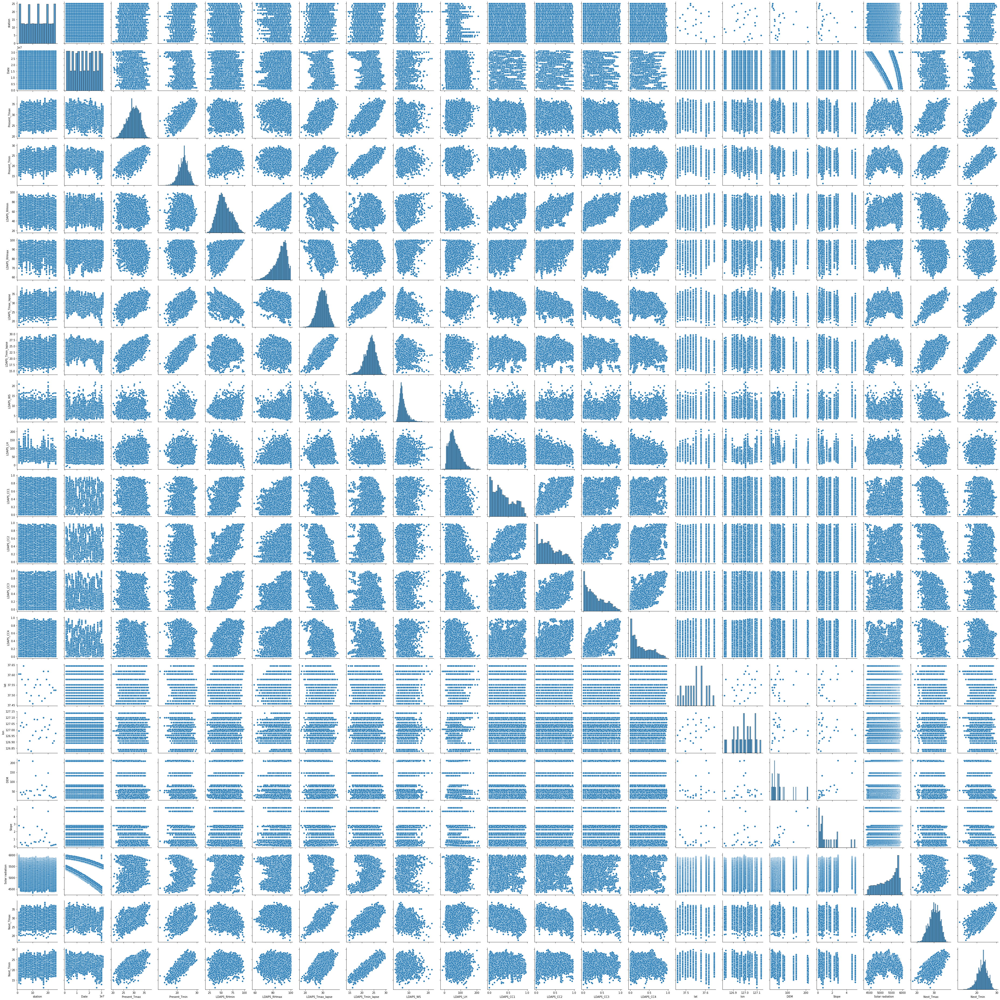

In [13]:
# Let's plot pairplot

sns.pairplot(temp_data)

Let's clear with heatmap...

Text(0.5, 1.0, 'Correlation Between Features')

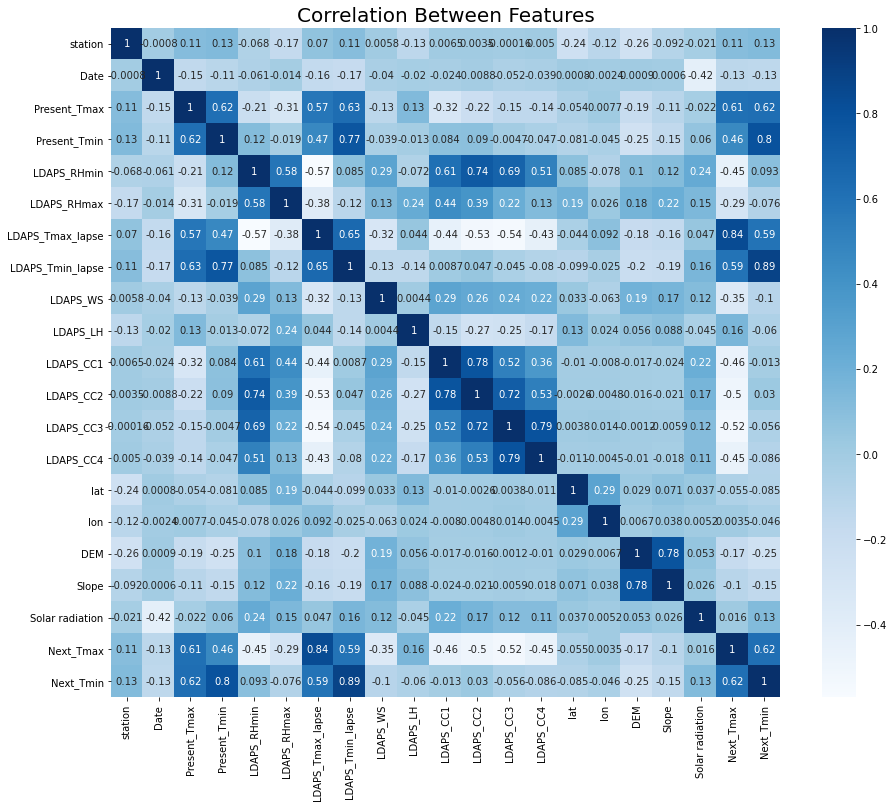

In [14]:
# Let's check the correlation heatmap

corr = temp_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr, cbar=True, annot=True, square=True, cbar_kws={"shrink":.82}, annot_kws={"size":10},
            cmap="Blues", fmt=".2g")
plt.title("Correlation Between Features", fontsize=20)

Heatmap Looks Good. No any columns is highly correlated to another column.

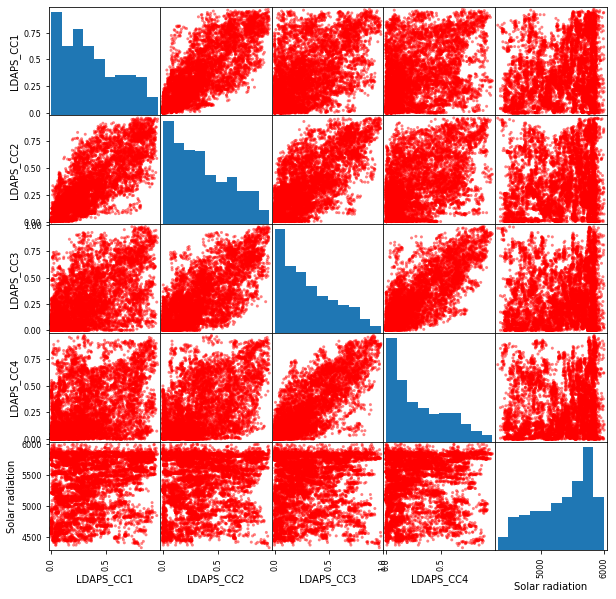

In [15]:
# Let's check how  Solar rediation is related to  LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4

from pandas.plotting import scatter_matrix

feature = ["LDAPS_CC1", "LDAPS_CC2", "LDAPS_CC3", "LDAPS_CC4", "Solar radiation"]
scatter_matrix(temp_data[feature], color='r', figsize=(10,10))
plt.show()

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_Tmax_lapse'>

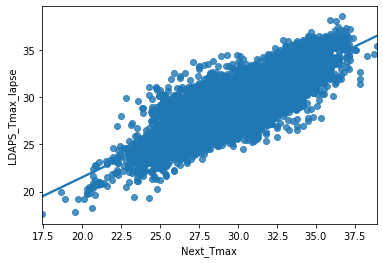

In [16]:
# Next_Tmax vs LDAPS_Tmax_lapse

sns.regplot(x="Next_Tmax", y="LDAPS_Tmax_lapse", data=temp_data)

# Heatmap shows that each one is related to 84%

<AxesSubplot:xlabel='Next_Tmin', ylabel='LDAPS_Tmin_lapse'>

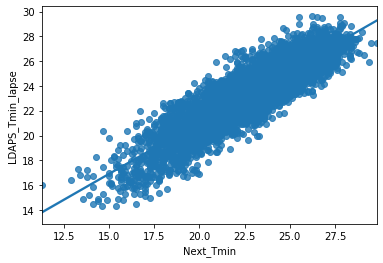

In [17]:
# Next_Tmin vs LDAPS_Tmin_lapse

sns.regplot(x="Next_Tmin", y="LDAPS_Tmin_lapse", data=temp_data)

# Heatmap shows that each one is related to 89%

In [18]:
# Let's chec the skewness

print(temp_data.skew())
print("Total number of numerical columns count : ",len(temp_data.skew()))
print("Total number of columns which are significant skewd : ",len(temp_data.skew().loc[abs(temp_data.skew())>0.5]))

station            -0.004178
Date               -0.010866
Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.845264
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.574035
LDAPS_WS            1.553926
LDAPS_LH            0.662971
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.639649
LDAPS_CC4           0.663815
lat                 0.085377
lon                -0.289048
DEM                 1.721617
Slope               1.559050
Solar radiation    -0.524325
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64
Total number of numerical columns count :  21
Total number of columns which are significant skewd :  9


In [19]:
# Let's use the skewness removing technique

for index in temp_data.skew().index:
    if temp_data.skew().loc[index]>0.5:
        temp_data[index] = np.log1p(temp_data[index])
    if temp_data.skew().loc[index]<-0.5:
        temp_data[index] = np.square(temp_data[index])

In [20]:
# Let's check the skewness again

print(temp_data.skew())
print("Total number of numerical column count : ",len(temp_data.skew()))
print("Total number of columns which are significant skewd : ",(len(temp_data.skew().loc[abs(temp_data.skew())>0.5])) + (len(temp_data.skew().loc[abs(temp_data.skew())<-0.5])))

station            -0.004178
Date               -0.010866
Present_Tmax       -0.257069
Present_Tmin       -0.353822
LDAPS_RHmin         0.301396
LDAPS_RHmax        -0.646160
LDAPS_Tmax_lapse   -0.222349
LDAPS_Tmin_lapse   -0.255434
LDAPS_WS            0.681138
LDAPS_LH           -0.251491
LDAPS_CC1           0.456716
LDAPS_CC2           0.473929
LDAPS_CC3           0.388007
LDAPS_CC4           0.441501
lat                 0.085377
lon                -0.289048
DEM                 0.443612
Slope               0.833888
Solar radiation    -0.431437
Next_Tmax          -0.334842
Next_Tmin          -0.393662
dtype: float64
Total number of numerical column count :  21
Total number of columns which are significant skewd :  3


In [21]:
# Let's again check the null values if any exists after skewness technique

temp_data.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            3
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [22]:
# One column LDAPS_LH ha has 3 null values. So, let's drop it...

index = temp_data.index[temp_data.isnull().any(axis=1)]
temp_data.drop(index, axis=0, inplace=True)

In [23]:
# Final shape of the dataset

temp_data.shape

(7585, 21)

## 1) Next_Tmax: Next day maximum temperature

In [24]:
# Let's separate the input and output columns

x_max = temp_data.drop(columns = ["Next_Tmax"], axis=1)
y_max = temp_data["Next_Tmax"]

In [25]:
# Let's do the scaling

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_x = scaler.fit_transform(x_max)

df_x

array([[-1.66420306,  1.5770325 , -0.35381255, ...,  1.30685485,
         1.59556895, -0.6895303 ],
       [-1.52565038,  1.5770325 ,  0.72481867, ..., -0.50982516,
         1.26966738, -0.1658085 ],
       [-1.3870977 ,  1.5770325 ,  0.62369699, ..., -0.8645062 ,
         1.25465158,  0.39819959],
       ...,
       [ 1.38395584,  1.57927936, -2.17400272, ..., -1.04592088,
        -1.99958755, -1.93840537],
       [ 1.52250851,  1.57927936, -2.17400272, ..., -0.93431421,
        -2.0093424 , -1.65640133],
       [ 1.66106119,  1.57927936, -2.20770995, ..., -0.85637937,
        -1.98370673, -2.22040942]])

In [26]:
# Let's import the necessary libraries 

from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, cross_val_score
from time import time

In [27]:
# Let's find the best random state

def bestmaxstate(mod):
    max_score = 0
    max_state = 0
    start = time()
    for i in range(1,201):
        x_train, x_test, y_train, y_test = train_test_split(df_x, y_max, test_size = 0.23, random_state=i)
        mod.fit(x_train, y_train)
        y_pre = mod.predict(x_test)
        score = r2_score(y_test, y_pre)
        if score > max_score:
            max_score = score
            max_state = i
    print("Best Random State is : ",max_state)
    print("Best R2_Score is     : ",max_score)
    print("Cross Validation Score is : ",cross_val_score(mod, df_x, y_max, cv=5, scoring='r2').mean())
    end = time()
    print("\nTime taken by model for prediction : {:.4f} seconds".format(end-start))

In [28]:
# Linear Regression

from sklearn.linear_model import LinearRegression
LR = LinearRegression()
bestmaxstate(LR)

Best Random State is :  5
Best R2_Score is     :  0.8140096057532972
Cross Validation Score is :  0.7375555526837948

Time taken by model for prediction : 1.8246 seconds


In [29]:
def bestmax(model):
    start = time()
    x_train, x_test, y_train, y_test = train_test_split(df_x, y_max, test_size = 0.23, random_state=5)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    score = r2_score(y_test, y_pred)
    print("Best R2_Score is          : ",score)
    print("Cross Validation Score is : ",cross_val_score(model, df_x, y_max, cv=5, scoring='r2').mean())
    end = time()
    print("\nTime taken by model for prediction : {:.4f} seconds".format(end-start))

In [30]:
# Decision Tree Regressor

from sklearn.tree import DecisionTreeRegressor
DTR = DecisionTreeRegressor()
bestmax(DTR)

Best R2_Score is          :  0.8179852354675384
Cross Validation Score is :  0.4604070262724572

Time taken by model for prediction : 1.0521 seconds


In [31]:
# K-Neighbors Regressor

from sklearn.neighbors import KNeighborsRegressor
KNR = KNeighborsRegressor()
bestmax(KNR)

Best R2_Score is          :  0.8645436636164727
Cross Validation Score is :  0.6089363749682049

Time taken by model for prediction : 2.0339 seconds


In [32]:
# Random Forest Regressor

from sklearn.ensemble import RandomForestRegressor
RFR = RandomForestRegressor()
bestmax(RFR)

Best R2_Score is          :  0.9156784443631873
Cross Validation Score is :  0.7107737617415301

Time taken by model for prediction : 67.6775 seconds


#### After analyzing the all scores. Now it is clear that Random Forest Regressor is giving the best score. So, let's try to increase the score using hyperparameter tuning...

In [33]:
# Final Model with Hyper-Parameter Tuning 


from sklearn.model_selection import GridSearchCV

param_grid = {"n_estimators" : [100,200],"criterion" : ["mse", "mae"],
              "min_samples_leaf" : [1,2,3], "min_samples_split" : [2,3,4]}

grid_search = GridSearchCV(RFR, param_grid)
grid_search.fit(x_train, y_train)


Final_Mix_Model = RandomForestRegressor(n_estimators=100 , criterion="mse" , min_samples_leaf=1, min_samples_split=2)
x_train, x_test, y_train, y_test = train_test_split(df_x, y_max, test_size=23, random_state = 5)
Final_Mix_Model.fit(x_train, y_train)
pred = Final_Mix_Model.predict(x_test)
r2_score(y_test, pred) 

0.9496319363505693

In [34]:
# Saving the Final Model

import joblib

joblib.dump(Final_Mix_Model,"Final_Mix_Model.pkl")

['Final_Mix_Model.pkl']

## 2) Next_Tmin: Next day minimum temperature

In [35]:
# Let's separate the input and output columns

x_min = temp_data.drop(columns = ["Next_Tmin"], axis=1)
y_min = temp_data["Next_Tmin"]

In [36]:
# Let's do the scaling

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_X = scaler.fit_transform(x_min)

df_X

array([[-1.66420306,  1.5770325 , -0.35381255, ...,  1.30685485,
         1.59556895, -0.36737919],
       [-1.52565038,  1.5770325 ,  0.72481867, ..., -0.50982516,
         1.26966738,  0.08260174],
       [-1.3870977 ,  1.5770325 ,  0.62369699, ..., -0.8645062 ,
         1.25465158,  0.27545071],
       ...,
       [ 1.38395584,  1.57927936, -2.17400272, ..., -1.04592088,
        -1.99958755, -0.62451115],
       [ 1.52250851,  1.57927936, -2.17400272, ..., -0.93431421,
        -2.0093424 , -0.52808667],
       [ 1.66106119,  1.57927936, -2.20770995, ..., -0.85637937,
        -1.98370673, -0.78521863]])

In [37]:
# Let's import the necessary libraries 

from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split, cross_val_score
from time import time

In [38]:
# Let's find the best random state

def bestminstate(mod):
    max_score = 0
    max_state = 0
    start = time()
    for i in range(1,201):
        x_train, x_test, y_train, y_test = train_test_split(df_X, y_min, test_size = 0.23, random_state=i)
        mod.fit(x_train, y_train)
        y_pre = mod.predict(x_test)
        score = r2_score(y_test, y_pre)
        if score > max_score:
            max_score = score
            max_state = i
    print("Best Random State is : ",max_state)
    print("Best R2_Score is     : ",max_score)
    print("Cross Validation Score is : ",cross_val_score(mod, df_X, y_min, cv=5, scoring='r2').mean())
    end = time()
    print("\nTime taken by model for prediction : {:.4f} seconds".format(end-start))

In [39]:
# Linear Regression

from sklearn.linear_model import LinearRegression
LR = LinearRegression()
bestminstate(LR)

Best Random State is :  71
Best R2_Score is     :  0.8606625465891611
Cross Validation Score is :  0.7990147983310377

Time taken by model for prediction : 1.8206 seconds


In [40]:
def bestmin(model):
    start = time()
    x_train, x_test, y_train, y_test = train_test_split(df_X, y_min, test_size = 0.23, random_state=71)
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    score = r2_score(y_test, y_pred)
    print("Best R2_Score is          : ",score)
    print("Cross Validation Score is : ",cross_val_score(model, df_X, y_min, cv=5, scoring='r2').mean())
    end = time()
    print("\nTime taken by model for prediction : {:.4f} seconds".format(end-start))

In [41]:
# Decision Tree Regressor

from sklearn.tree import DecisionTreeRegressor
DTR = DecisionTreeRegressor()
bestmin(DTR)

Best R2_Score is          :  0.8042740651833169
Cross Validation Score is :  0.5819214936544945

Time taken by model for prediction : 1.0597 seconds


In [42]:
# K-Neighbors Regressor

from sklearn.neighbors import KNeighborsRegressor
KNR = KNeighborsRegressor()
bestmin(KNR)

Best R2_Score is          :  0.8812262847193633
Cross Validation Score is :  0.6730508176681308

Time taken by model for prediction : 2.3026 seconds


In [43]:
# Random Forest Regressor

from sklearn.ensemble import RandomForestRegressor
RFR = RandomForestRegressor()
bestmin(RFR)

Best R2_Score is          :  0.9162150404759336
Cross Validation Score is :  0.7906234612602427

Time taken by model for prediction : 73.2013 seconds


#### After analyzing the all scores. Now it is clear that Random Forest Regressor is giving the best score. So, let's try to increase the score using hyperparameter tuning...

In [45]:
# Final Model with Hyper-Parameter Tuning 


from sklearn.model_selection import GridSearchCV

param_grid = {"n_estimators" : [100,200],"criterion" : ["mse", "mae"],
              "min_samples_leaf" : [1,2,3], "min_samples_split" : [2,3,4]}

grid_search = GridSearchCV(RFR, param_grid)
grid_search.fit(x_train, y_train)


Final_Min_Model = RandomForestRegressor(n_estimators=100 , criterion="mse" , min_samples_leaf=1, min_samples_split=2)
x_train, x_test, y_train, y_test = train_test_split(df_X, y_min, test_size=23, random_state = 71)
Final_Min_Model.fit(x_train, y_train)
pred = Final_Min_Model.predict(x_test)
r2_score(y_test, pred) 

0.8298326116607633

In [46]:
# Saving the Final Model

import joblib

joblib.dump(Final_Min_Model,"Final_Min_Model.pkl")

['Final_Min_Model.pkl']